#  Traking

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Fonction pour afficher deux images côte à côte
def show_two_frames(frame1, frame2, title1="Original", title2="Processed"):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB))
    plt.title(title1)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
    plt.title(title2)
    plt.axis('off')

    plt.show()

## **1. Object localization:**

### Our vidéo

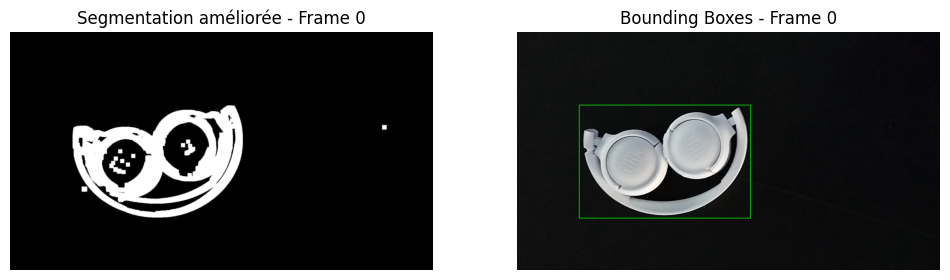

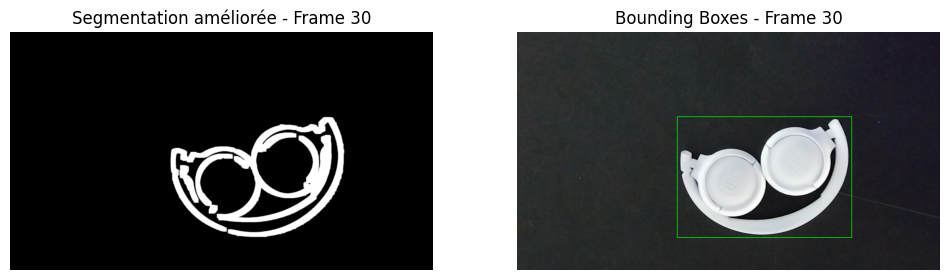

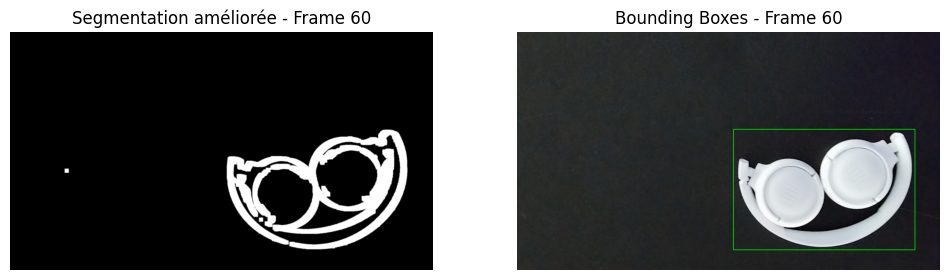

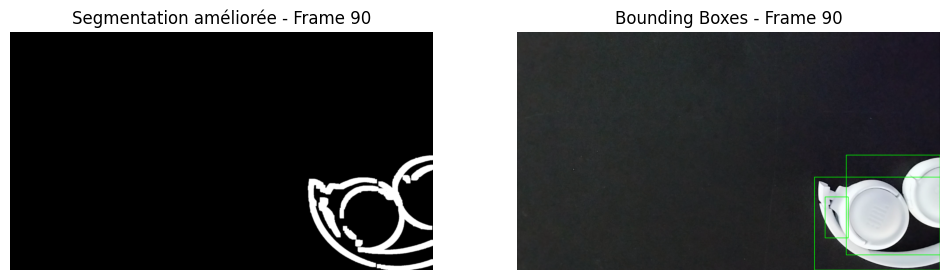

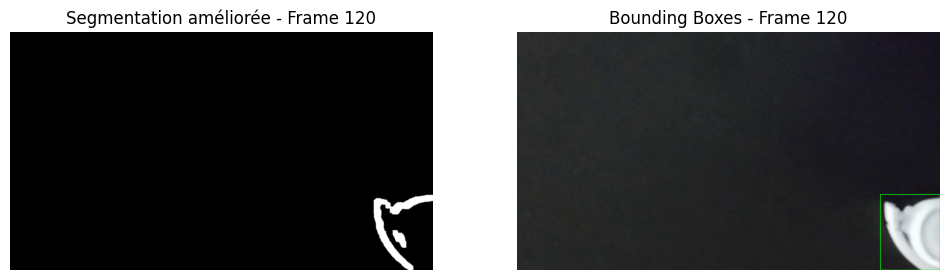

Fin de la vidéo
Vidéo de sortie enregistrée à : /content/drive/MyDrive/TP Analyse Vidéo/our_video_detection.mp4


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
# Charger la vidéo
video_path = "/content/drive/MyDrive/TP Analyse Vidéo/Vidéo_TP1.mp4"  # Chemin mis à jour
video = cv2.VideoCapture(video_path)

if not video.isOpened():
    print("Erreur : Impossible de lire la vidéo")
    exit()

# Lire la première frame
ret, frame = video.read()
if not ret:
    print("Erreur lors de la lecture de la première frame")
    video.release()
    exit()

# Obtenir les dimensions de la vidéo
frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video.get(cv2.CAP_PROP_FPS))

# Initialiser l'écriture de la vidéo
output_path = "/content/drive/MyDrive/TP Analyse Vidéo/our_video_detection.mp4"
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec pour le format MP4
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Convertir en niveaux de gris
previous_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Compteur de frames
frame_count = 0

while True:
    ret, frame = video.read()
    if not ret:
        print("Fin de la vidéo")
        break

    # Conversion en niveaux de gris
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Méthode de soustraction
    diff = cv2.absdiff(previous_frame, gray_frame)

    # Seuillage
    _, movement_mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    # Fermeture pour combler les contours fragmentés
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))  # Kernel pour fermeture
    closed_mask = cv2.morphologyEx(movement_mask, cv2.MORPH_CLOSE, kernel_close)

    # Dilatation pour renforcer les objets connectés
    kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 10))  # Kernel pour dilatation
    dilated_mask = cv2.dilate(closed_mask, kernel_dilate, iterations=2)

    # Lissage pour uniformiser les bords
    smoothed_mask = cv2.GaussianBlur(dilated_mask, (5, 5), 0)

    # Extraction des contours après traitement
    contours, _ = cv2.findContours(smoothed_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    frame_with_boxes = frame.copy()

    # Dessiner les bounding boxes pour chaque objet détecté
    for contour in contours:
        if cv2.contourArea(contour) > 5000:  # Filtrer les petits contours
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(frame_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Ajouter la frame avec les bounding boxes à la vidéo de sortie
    out.write(frame_with_boxes)

    # Afficher les résultats toutes les 30 frames
    if frame_count % 30 == 0:
        show_two_frames(smoothed_mask, frame_with_boxes,
                        title1=f"Segmentation améliorée - Frame {frame_count}",
                        title2=f"Bounding Boxes - Frame {frame_count}")

    # Mise à jour de la frame précédente
    previous_frame = gray_frame.copy()
    frame_count += 1

    # Arrêter la lecture si l'utilisateur appuie sur 'q'
    if cv2.waitKey(30) & 0xFF == ord('q'):
        print("Lecture interrompue par l'utilisateur")
        break

# Libérer les ressources
video.release()
out.release()
cv2.destroyAllWindows()

print(f"Vidéo de sortie enregistrée à : {output_path}")


## Easy video

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_two_frames(segmented, bbox_frame, title1="Segmented Image", title2="Bounding Box Image"):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(segmented, cmap='gray')
    plt.title(title1)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(bbox_frame, cv2.COLOR_BGR2RGB))
    plt.title(title2)
    plt.axis('off')
    plt.show()


# Charger la vidéo
video_path = "/content/drive/MyDrive/TP Analyse Vidéo/multi_objects_video.mp4"  # Mettre le chemin de la nouvelle vidéo
cap = cv2.VideoCapture(video_path)

# Initialiser le soustracteur de fond
fgbg = cv2.createBackgroundSubtractorKNN(history=300, dist2Threshold=400, detectShadows=True)

# Définir les kernels pour les transformations morphologiques
kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9))  # Fermeture (plus grand pour combler les trous)
kernel_open = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))  # Ouverture (supprimer les artefacts)
kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))  # Dilatation pour renforcer les contours

# Initialiser les objets détectés
object_positions = {}
stable_objects = set()

# Compteur de frames
frame_count = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convertir la frame en niveaux de gris
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Appliquer la soustraction de fond
    fgmask = fgbg.apply(frame)

    # Fermeture pour combler les trous internes
    closing = cv2.morphologyEx(fgmask, cv2.MORPH_CLOSE, kernel_close)

    # Dilatation pour renforcer les objets connectés
    dilated = cv2.dilate(closing, kernel_dilate, iterations=1)

    # Ouverture pour supprimer les petits artefacts restants
    opening = cv2.morphologyEx(dilated, cv2.MORPH_OPEN, kernel_open)

    # Lisser l'image segmentée pour uniformiser les bords
    smoothed = cv2.GaussianBlur(opening, (5, 5), 0)

    # Copier la frame originale pour dessiner les bounding boxes
    frame_with_boxes = frame.copy()

    # Trouver les contours dans l'image segmentée
    contours, _ = cv2.findContours(smoothed.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Dessiner les bounding boxes autour des objets détectés
    for contour in contours:
        if cv2.contourArea(contour) > 1000:  # Filtrer les petits objets avec une aire minimale
            x, y, w, h = cv2.boundingRect(contour)
            centroid = (x + w // 2, y + h // 2)

            # Suivi des objets détectés
            if centroid in object_positions:
                object_positions[centroid] += 1
                if object_positions[centroid] > 50:  # Si l'objet est stable, l'ajouter aux objets stables
                    stable_objects.add(centroid)
            else:
                object_positions[centroid] = 1

            # Dessiner les bounding boxes seulement pour les objets non stables
            if centroid not in stable_objects:
                cv2.rectangle(frame_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Afficher les résultats toutes les 30 frames
    if frame_count % 30 == 0:
        show_two_frames(smoothed, frame_with_boxes,
                        title1=f"Improved Segmentation - Frame {frame_count}",
                        title2=f"Bounding Boxes - Frame {frame_count}")

    frame_count += 1

cap.release()
print("Traitement terminé")


Frames segmentées enregistrées dans : /content/segmented_frames
Frames avec bounding boxes enregistrées dans : /content/bbox_frames
Traitement terminé


## **2. Object Tracking:**

In [ ]:
import math


class EuclideanDistTracker:
    def __init__(self):
        # Store the center positions of the objects
        self.center_points = {}
        # Keep the count of the IDs
        # each time a new object id detected, the count will increase by one
        self.id_count = 0


    def update(self, objects_rect):
        # Objects boxes and ids
        objects_bbs_ids = []

        # Get center point of new object
        for rect in objects_rect:
            x, y, w, h = rect
            cx = (x + x + w) // 2
            cy = (y + y + h) // 2

            # Find out if that object was detected already
            same_object_detected = False
            for id, pt in self.center_points.items():
                dist = math.hypot(cx - pt[0], cy - pt[1])

                if dist < 25:
                    self.center_points[id] = (cx, cy)
                    print(self.center_points)
                    objects_bbs_ids.append([x, y, w, h, id])
                    same_object_detected = True
                    break

            # New object is detected we assign the ID to that object
            if same_object_detected is False:
                self.center_points[self.id_count] = (cx, cy)
                objects_bbs_ids.append([x, y, w, h, self.id_count])
                self.id_count += 1

        # Clean the dictionary by center points to remove IDS not used anymore
        new_center_points = {}
        for obj_bb_id in objects_bbs_ids:
            _, _, _, _, object_id = obj_bb_id
            center = self.center_points[object_id]
            new_center_points[object_id] = center

        # Update dictionary with IDs not used removed
        self.center_points = new_center_points.copy()
        return objects_bbs_ids

### Our Video

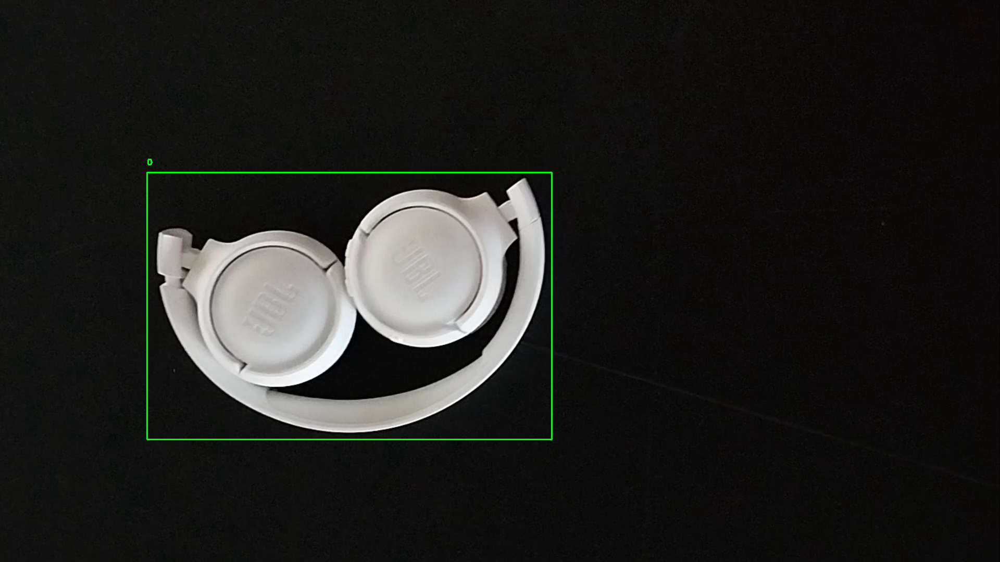

{0: (680, 589)}
{0: (689, 590)}
{0: (695, 591)}
{0: (702, 592)}
{0: (708, 593)}
{2: (857, 620)}
{2: (871, 623)}
{2: (892, 627)}
{2: (915, 631)}
{4: (992, 649)}
{4: (1009, 652)}
{4: (1027, 655)}
{4: (1036, 655)}
{4: (1041, 654)}
{4: (1045, 654)}
{4: (1050, 653)}
{4: (1058, 653)}
{4: (1067, 653)}
{4: (1075, 653)}
{4: (1082, 653)}
{4: (1089, 654)}
{4: (1100, 655)}
{4: (1109, 657)}
{4: (1112, 656)}
{4: (1118, 657)}
{4: (1123, 658)}


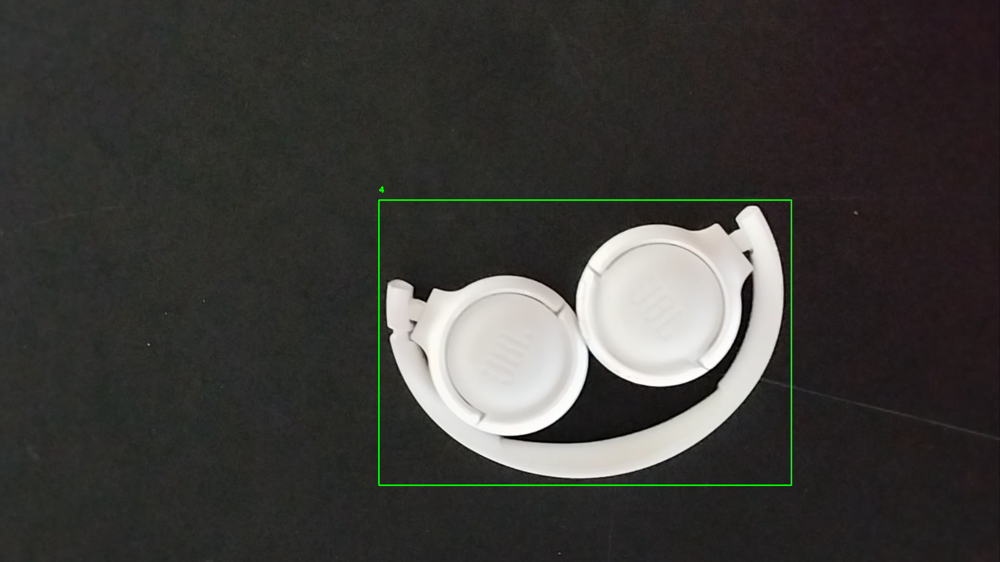

{4: (1136, 659)}
{4: (1151, 663)}
{4: (1160, 665)}
{4: (1172, 667)}
{4: (1183, 668)}
{4: (1198, 670)}
{4: (1214, 673)}
{4: (1224, 675)}
{4: (1232, 675)}
{4: (1240, 677)}
{4: (1247, 678)}
{4: (1250, 679)}
{4: (1257, 680)}
{7: (1270, 683)}
{7: (1276, 683)}
{7: (1282, 673)}
{7: (1289, 687)}
{7: (1297, 687)}
{7: (1305, 689)}
{7: (1314, 691)}
{7: (1322, 692)}
{7: (1332, 694)}
{7: (1341, 696)}
{7: (1351, 700)}
{7: (1362, 704)}
{7: (1374, 708)}
{7: (1385, 711)}
{7: (1394, 714)}


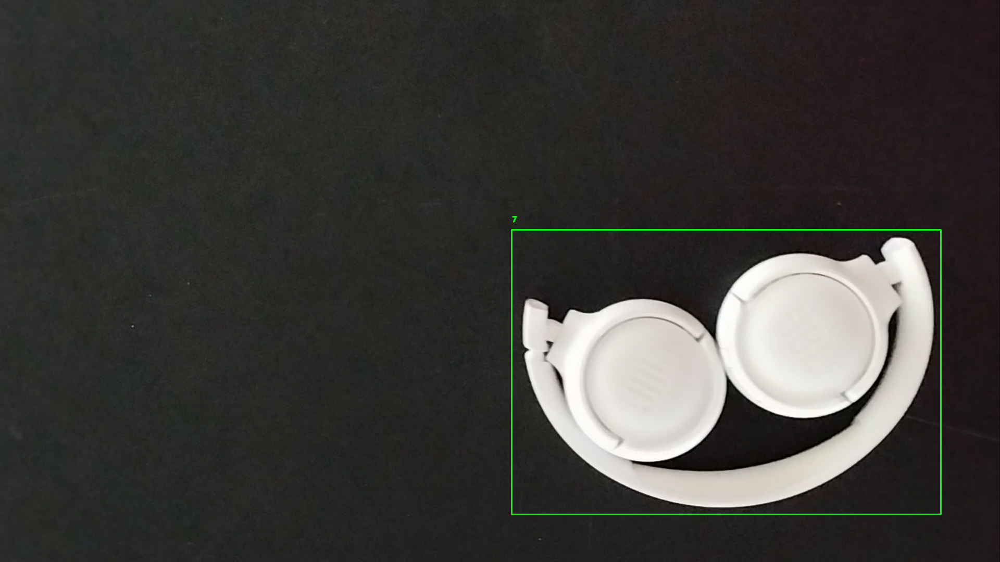

{7: (1404, 718)}
{7: (1415, 722)}
{7: (1424, 723)}
{7: (1434, 724)}
{7: (1445, 727)}
{7: (1459, 729)}
{7: (1475, 732)}
{7: (1490, 735)}
{7: (1501, 737)}
{7: (1509, 742)}
{7: (1525, 746)}
{7: (1534, 750)}
{7: (1540, 752), 8: (1772, 581)}
{8: (1772, 581), 7: (1547, 757)}
{7: (1558, 763)}
{7: (1563, 770)}
{7: (1569, 788)}
{7: (1575, 793)}
{7: (1582, 798)}
{7: (1588, 802)}
{7: (1597, 806)}
{7: (1604, 809)}
{7: (1610, 812)}
{7: (1615, 814)}
{7: (1621, 804), 9: (1766, 1045), 10: (1421, 830)}
{9: (1766, 1045), 10: (1428, 832), 7: (1621, 804)}
{9: (1766, 1045), 10: (1428, 832), 7: (1625, 817)}
{10: (1428, 832), 7: (1627, 818), 11: (1454, 853)}
{11: (1455, 851), 7: (1627, 818)}
{11: (1455, 851), 7: (1631, 819)}
{11: (1447, 840), 7: (1631, 819), 12: (1780, 1053)}
{11: (1447, 840), 7: (1634, 809), 12: (1780, 1053)}
{12: (1780, 1053), 11: (1450, 841), 7: (1634, 809)}


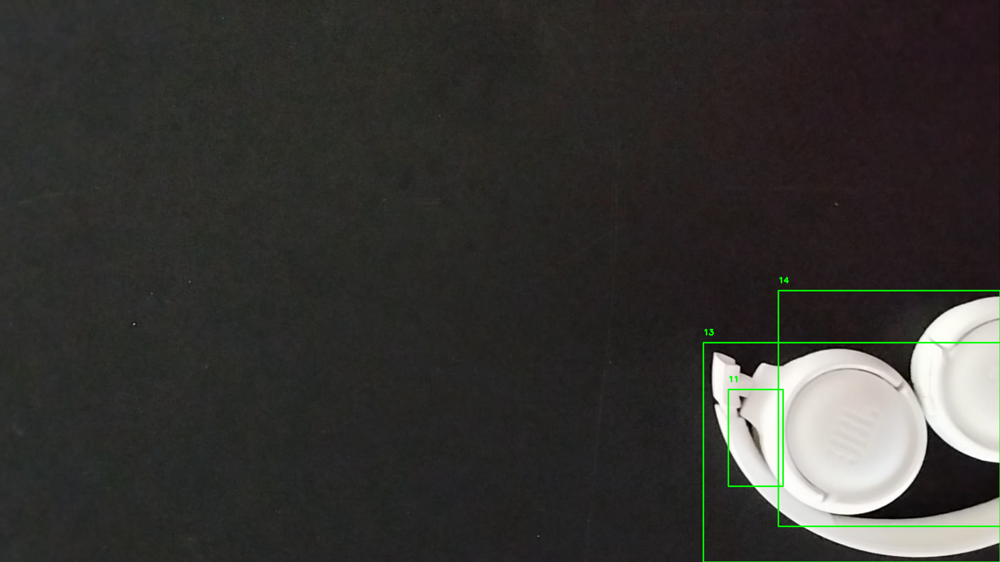

{11: (1467, 855), 13: (1635, 869), 14: (1707, 784), 15: (1801, 1056)}
{15: (1801, 1056), 11: (1473, 857), 16: (1636, 814)}
{15: (1801, 1056), 11: (1473, 857), 16: (1640, 819)}
{11: (1459, 837), 16: (1640, 819)}
{11: (1459, 837), 16: (1642, 819)}
{17: (1787, 1059), 18: (1777, 917), 19: (1545, 829), 20: (1523, 860), 21: (1803, 671)}
{17: (1787, 1059), 18: (1777, 917), 19: (1545, 829), 20: (1530, 866), 21: (1803, 671)}
{17: (1787, 1059), 18: (1777, 917), 19: (1545, 829), 20: (1530, 866), 21: (1808, 680)}
{18: (1788, 920), 20: (1530, 866), 21: (1808, 680)}
{18: (1801, 927), 22: (1655, 823)}
{18: (1801, 927), 22: (1664, 829)}
{18: (1808, 931), 22: (1664, 829)}
{18: (1808, 931), 22: (1673, 834)}
{18: (1825, 937), 22: (1673, 834)}
{18: (1825, 937), 22: (1685, 842)}
{18: (1834, 949), 22: (1685, 842)}
{18: (1834, 949), 22: (1696, 854)}
{18: (1834, 949), 22: (1708, 868), 23: (1845, 1002)}
{23: (1862, 1019), 22: (1708, 868)}
{23: (1862, 1019), 22: (1720, 888)}
{23: (1862, 1019), 22: (1732, 890)}


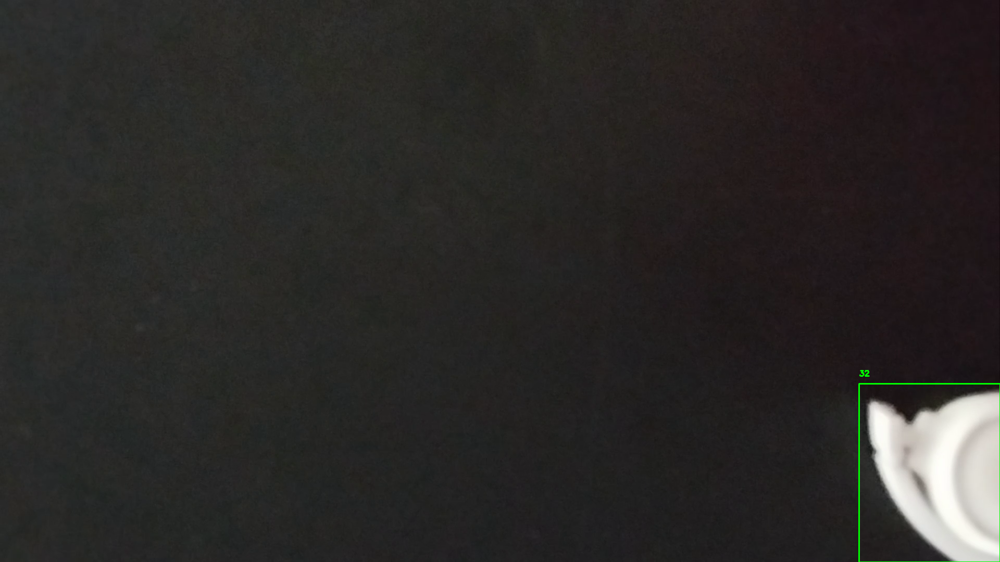

{32: (1786, 911)}
{35: (1795, 913)}
{35: (1799, 913)}
{35: (1808, 917), 36: (1893, 912)}
{36: (1899, 928), 35: (1808, 917)}
{36: (1899, 928), 35: (1814, 918)}
{36: (1899, 928), 35: (1821, 921)}
{35: (1827, 925)}
{35: (1835, 926)}
{35: (1842, 928)}
{35: (1850, 931)}
{35: (1857, 933)}
{35: (1865, 929)}
{35: (1871, 924)}
{35: (1878, 921)}
{35: (1884, 914)}
{35: (1889, 908)}
{35: (1894, 902)}
{35: (1899, 894)}
Fin de la vidéo
Vidéo de sortie enregistrée à : /content/drive/MyDrive/TP Analyse Vidéo/our_video_tracking.mp4


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the video
video_path = "/content/drive/MyDrive/TP Analyse Vidéo/Vidéo_TP1.mp4"
video = cv2.VideoCapture(video_path)

if not video.isOpened():
    print("Erreur : Impossible de lire la vidéo")
    exit()

# Read the first frame
ret, frame = video.read()
if not ret:
    print("Erreur lors de la lecture de la première frame")
    video.release()
    exit()

# Video properties
frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video.get(cv2.CAP_PROP_FPS))

# Initialize video writer
output_path = "/content/drive/MyDrive/TP Analyse Vidéo/our_video_tracking.mp4"
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Convert first frame to grayscale
previous_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Frame counter
frame_count = 0

# Initialize tracker
tracker = EuclideanDistTracker()

while True:
    ret, frame = video.read()
    if not ret:
        print("Fin de la vidéo")
        break

    # Convert frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Frame difference and thresholding
    diff = cv2.absdiff(previous_frame, gray_frame)
    _, movement_mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    # Morphological operations to clean up the mask
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    closed_mask = cv2.morphologyEx(movement_mask, cv2.MORPH_CLOSE, kernel_close)

    kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 10))
    dilated_mask = cv2.dilate(closed_mask, kernel_dilate, iterations=2)

    # Smooth the edges
    smoothed_mask = cv2.GaussianBlur(dilated_mask, (5, 5), 0)

    # Find contours
    contours, _ = cv2.findContours(smoothed_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    frame_with_boxes = frame.copy()
    objects_rect = []

    for contour in contours:
        if cv2.contourArea(contour) > 5000:
            x, y, w, h = cv2.boundingRect(contour)
            objects_rect.append([x, y, w, h])

    # Update tracker
    objects_bbs_ids = tracker.update(objects_rect)

    # Draw bounding boxes with IDs
    for obj_bb_id in objects_bbs_ids:
        x, y, w, h, obj_id = obj_bb_id
        cv2.rectangle(frame_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame_with_boxes, str(obj_id), (x, y - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Save and display the frame
    out.write(frame_with_boxes)

    # Optionally display the frame
    if frame_count % 30 == 0:
        cv2_imshow(frame_with_boxes)  # Use cv2_imshow instead of cv2.imshow
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Update the previous frame
    previous_frame = gray_frame.copy()
    frame_count += 1

# Release all resources
video.release()
out.release()
cv2.destroyAllWindows()
print(f"Vidéo de sortie enregistrée à : {output_path}")


## CSRT Tracker

In [ ]:
import math

class EuclideanDistTracker:
    def __init__(self):
        self.center_points = {}
        self.id_count = 0
        self.dist_thresh = 25
        self.area_change_thresh = 0.5  # 50% change in area
        self.aspect_ratio_change_thresh = 0.2  # 20% change in aspect ratio

    def update(self, objects_rect):
        objects_bbs_ids = []
        new_center_points = {}

        for rect in objects_rect:
            x, y, w, h = rect
            cx = (x + x + w) // 2
            cy = (y + y + h) // 2
            area = w * h
            aspect_ratio = w / h

            # Check for a matching existing object
            match_found = False
            for id, (pt_x, pt_y, pt_area, pt_aspect) in self.center_points.items():
                dist = math.hypot(cx - pt_x, cy - pt_y)
                area_change = abs(area - pt_area) / pt_area
                aspect_change = abs(aspect_ratio - pt_aspect) / pt_aspect

                if (dist < self.dist_thresh and
                    area_change < self.area_change_thresh and
                    aspect_change < self.aspect_ratio_change_thresh):
                    objects_bbs_ids.append([x, y, w, h, id])
                    new_center_points[id] = (cx, cy, area, aspect_ratio)
                    match_found = True
                    break

            # If no match found, assign new ID
            if not match_found:
                self.center_points[self.id_count] = (cx, cy, area, aspect_ratio)
                objects_bbs_ids.append([x, y, w, h, self.id_count])
                new_center_points[self.id_count] = (cx, cy, area, aspect_ratio)
                self.id_count += 1

        # Update dictionary with current active objects
        self.center_points = new_center_points
        return objects_bbs_ids


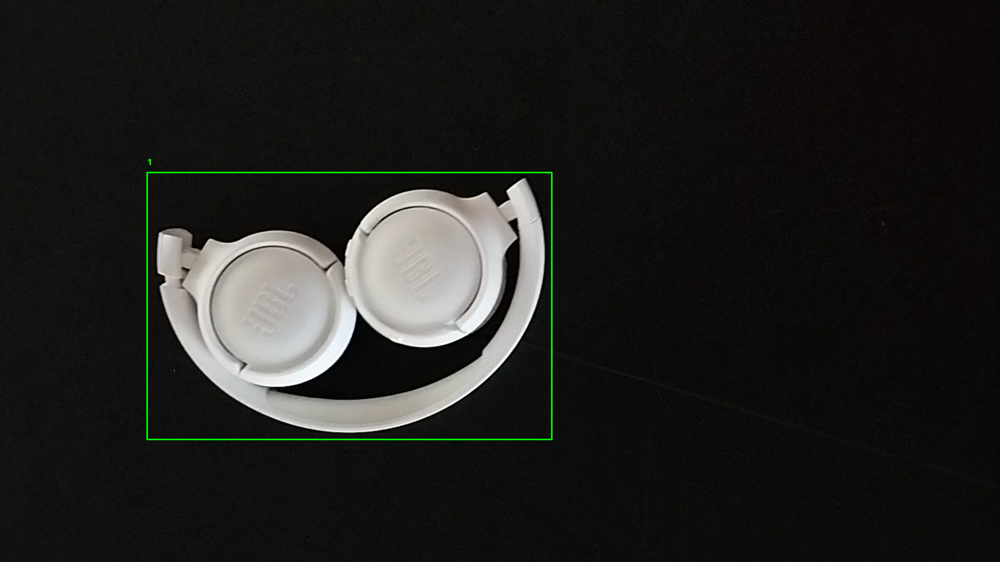

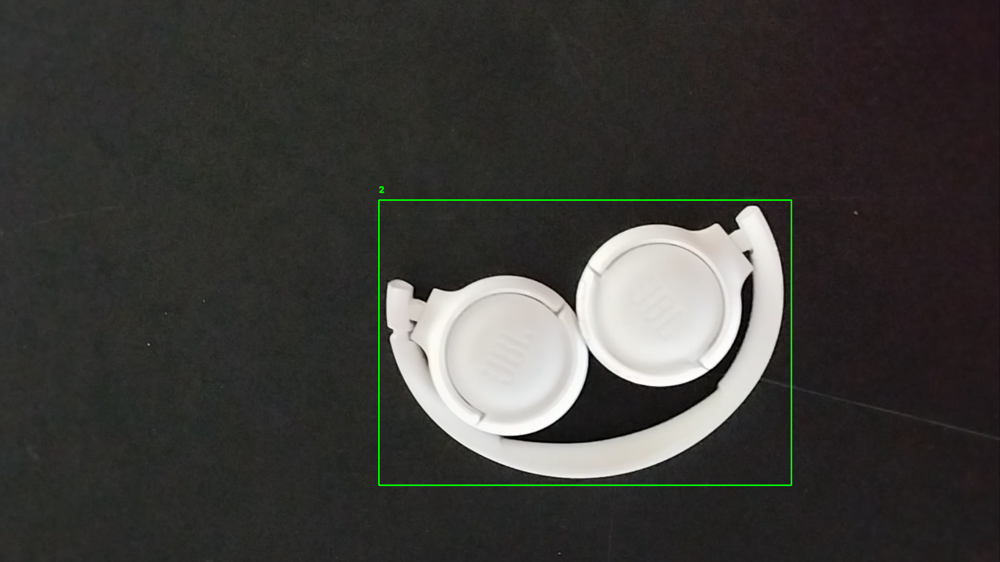

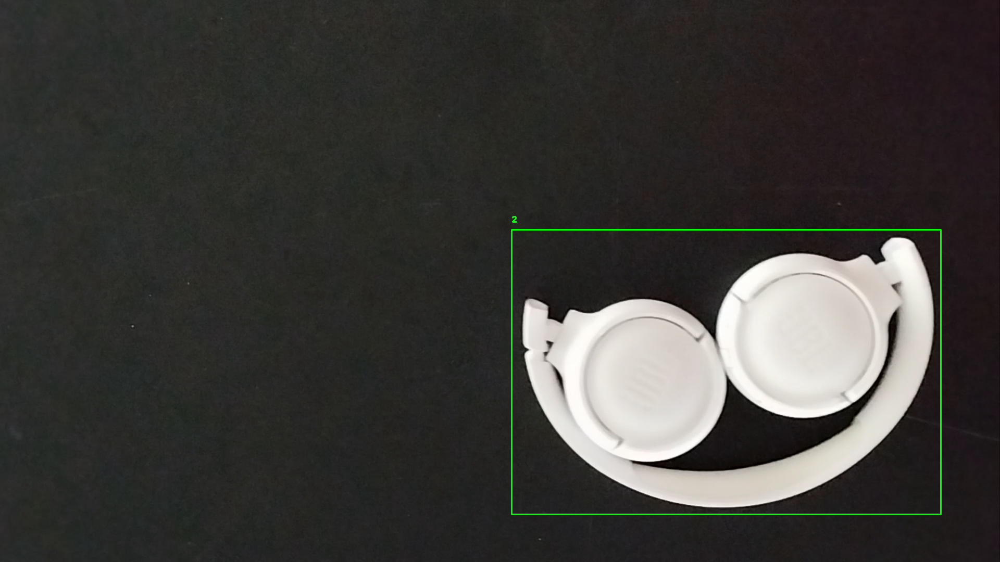

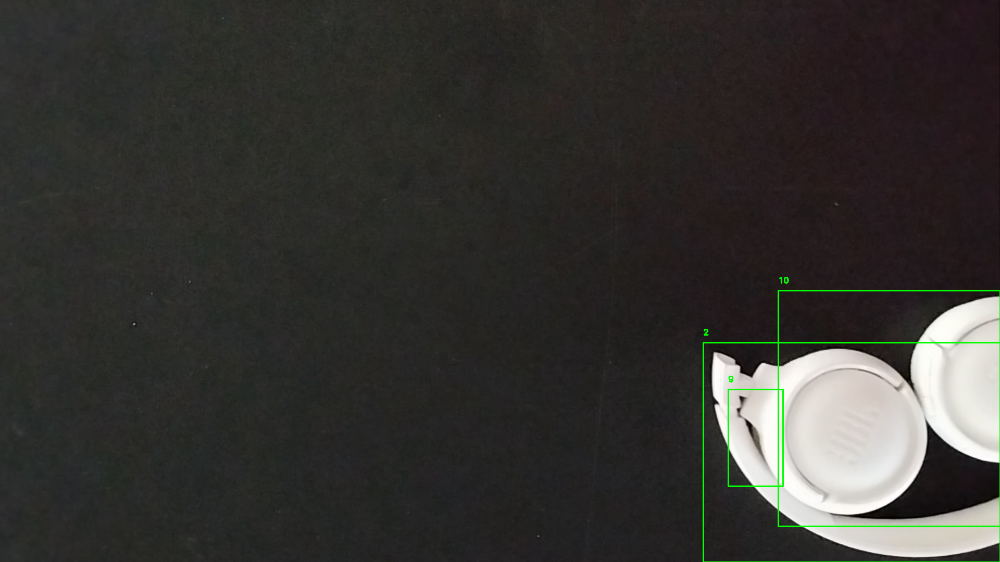

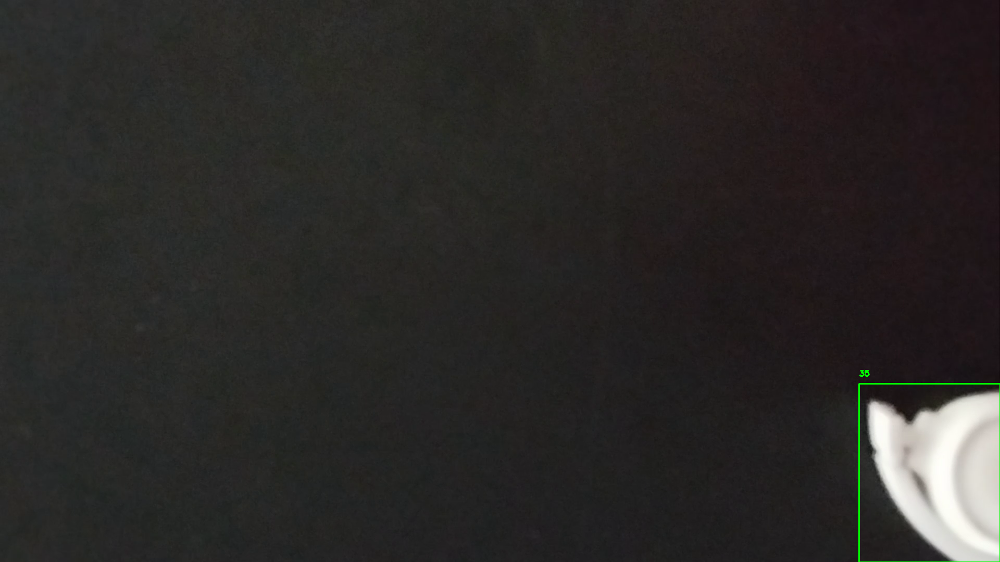

Fin de la vidéo
Vidéo de sortie enregistrée à : /content/drive/MyDrive/TP Analyse Vidéo/TP3_Traking /our_video_modified_tracking.mp4


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the video
video_path = "/content/drive/MyDrive/TP Analyse Vidéo/Vidéo_TP1.mp4"
video = cv2.VideoCapture(video_path)

if not video.isOpened():
    print("Erreur : Impossible de lire la vidéo")
    exit()

# Read the first frame
ret, frame = video.read()
if not ret:
    print("Erreur lors de la lecture de la première frame")
    video.release()
    exit()

# Video properties
frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video.get(cv2.CAP_PROP_FPS))

# Initialize video writer
output_path = "/content/drive/MyDrive/TP Analyse Vidéo/our_video_modified_tracking.mp4"
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Convert first frame to grayscale
previous_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Frame counter
frame_count = 0

# Initialize tracker
tracker = EuclideanDistTracker()

while True:
    ret, frame = video.read()
    if not ret:
        print("Fin de la vidéo")
        break

    # Convert frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Frame difference and thresholding
    diff = cv2.absdiff(previous_frame, gray_frame)
    _, movement_mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    # Morphological operations to clean up the mask
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    closed_mask = cv2.morphologyEx(movement_mask, cv2.MORPH_CLOSE, kernel_close)

    kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (10, 10))
    dilated_mask = cv2.dilate(closed_mask, kernel_dilate, iterations=2)

    # Smooth the edges
    smoothed_mask = cv2.GaussianBlur(dilated_mask, (5, 5), 0)

    # Find contours
    contours, _ = cv2.findContours(smoothed_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    frame_with_boxes = frame.copy()
    objects_rect = []

    for contour in contours:
        if cv2.contourArea(contour) > 5000:
            x, y, w, h = cv2.boundingRect(contour)
            objects_rect.append([x, y, w, h])

    # Update tracker
    objects_bbs_ids = tracker.update(objects_rect)

    # Draw bounding boxes with IDs
    for obj_bb_id in objects_bbs_ids:
        x, y, w, h, obj_id = obj_bb_id
        cv2.rectangle(frame_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame_with_boxes, str(obj_id), (x, y - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Save and display the frame
    out.write(frame_with_boxes)

    # Optionally display the frame
    if frame_count % 30 == 0:
        cv2_imshow(frame_with_boxes)  # Use cv2_imshow instead of cv2.imshow
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Update the previous frame
    previous_frame = gray_frame.copy()
    frame_count += 1

# Release all resources
video.release()
out.release()
cv2.destroyAllWindows()
print(f"Vidéo de sortie enregistrée à : {output_path}")
